In [2]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as pl
import seaborn as sns

In [3]:
df = pd.read_csv("filled_data.csv")

C:\Users\wang-\AppData\Local\Temp\ipykernel_22080\2620525001.py:1: DtypeWarning: Columns (28) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("filled_data.csv")


x - interest rate vs y - ____(income or stg else) to find the ppl who are reliable and have a high interest rate, maybe they earn more or are of a certain profession so you wanna target them cuz they are more stable. To find characteristics of each loan.


In [5]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'ID', 'Customer_ID', 'Month', 'Name',
       'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Type_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
       'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score', 'Credit_History_Age_float'],
      dtype='object')

In [4]:
del df['Unnamed: 0']
del df['Unnamed: 0.1']

In [5]:
df['Monthly_Inhand_Salary'].describe()

count    150000.000000
mean       4192.092763
std        3182.450174
min         303.645417
25%        1625.265833
50%        3091.000000
75%        5950.863333
max       15204.633330
Name: Monthly_Inhand_Salary, dtype: float64

In [6]:
income_bins = [300, 1000, 3000, 5000, 10000, 15000, 16000]
income_labels = ['300-1000', '1000-3000', '3000-5000', '5000-10000', '10000-15000', '15000+']
df['Grouped_Monthly_Inhand_Salary'] = pd.cut(df['Monthly_Inhand_Salary'], bins=income_bins, labels=income_labels)


In [ ]:
mean_delay = subset_df['Num_of_Delayed_Payment'].mean()

In [8]:
px.scatter(df, x="Grouped_Monthly_Inhand_Salary", y="Delay_from_due_date", size="Interest_Rate")
# pl.scatter(df.Interest_Rate, df.Monthly_Inhand_Salary)

In [12]:
px.scatter(df, x="Interest_Rate", y="Delay_from_due_date", size="Monthly_Inhand_Salary")

TypeError: unsupported operand type(s) for /: 'str' and 'int'

Maybe visualize number of loans to delay from due date. Or correlate delay from due date to total_debt/total_EMI, to find trends if stg is linked to a delayed debt, mayvbe too many loans etc. 


In [18]:
px.scatter(df, x="Num_of_Loan", y="Delay_from_due_date")

In [24]:
df['Delay_from_due_date'].corr(df['Total_EMI_per_month'])

0.06166780793218407

In [25]:
df['Delay_from_due_date'].corr(df['Outstanding_Debt'])

0.5716499841448421

In [26]:
df['Delay_from_due_date'].corr(df['Num_of_Loan'])

0.5013362911320157

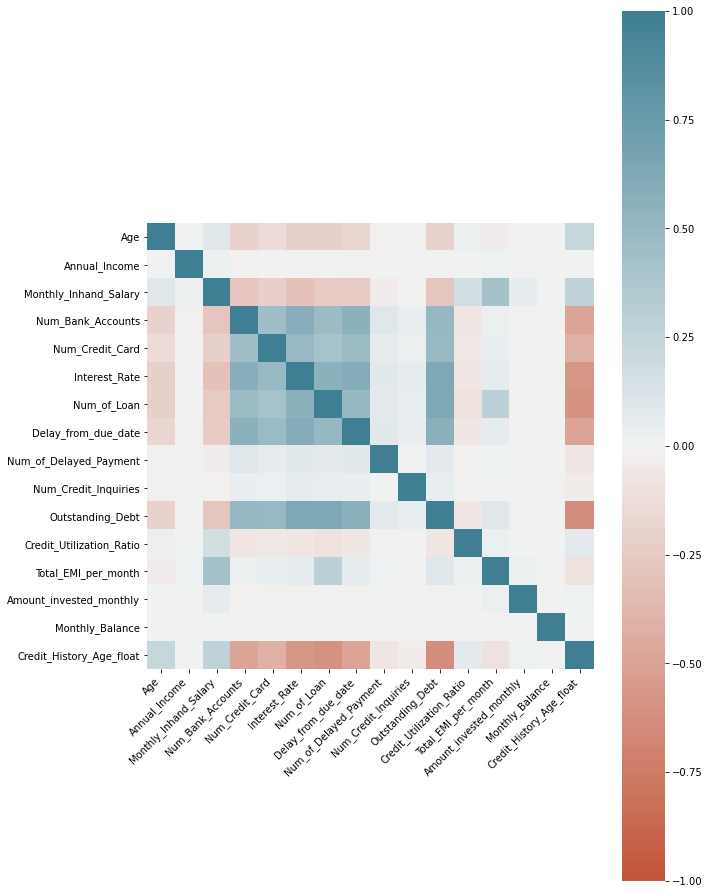

In [33]:
corr = df.corr()
pl.figure(figsize=(10, 16))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);